In [18]:
import pandas as pd
import os 
import random
import subprocess
 
import dask.dataframe as dd
import seaborn as sns
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt

In [19]:
path = '/carnegie/nobackup/scratch/tbellagio/gea_grene-net/gwas/fitness_gwas'

In [20]:
site = 'site_4'

In [21]:
pvalues_file = path + f'/{site}/output/results_lmm.csv'
pvalues = dd.read_csv(pvalues_file)
pvalues = pvalues.compute()

In [95]:
len(pvalues)

1147892

In [23]:
def list_only_directories(path):
    # List all entries in the directory specified by path
    all_entries = os.listdir(path)
    all_entries = [i for i in os.listdir(path,) if 'site' in i]
    
    # Filter out the entries that are directories
    folder_names = [entry for entry in all_entries if os.path.isdir(os.path.join(path, entry))]
    
    return folder_names

# Usage example
sites = list_only_directories(path)

In [33]:
## create a dir 

# create sbatch files to submit on cedar server
shfiles = []
for site in sites:
    seed = random.randint(1,100000000)
    file = f'wza_{site}.sh'
    cmd = f'python general_WZA_script_mod_polynomial_order7.py --correlations {site}/output/results_lmm.csv --summary_stat p_wald --window blocks --output {site}/wza_fitness_gwas_poly7.csv --sep ","'
    text = f'''#!/bin/bash
#SBATCH --job-name=wza{site}
#SBATCH --time=1:00:00  # Time limit set to 4 days
#SBATCH --ntasks=1
#SBATCH --mem-per-cpu=30gb
#SBATCH --output=wza_{site}%j.out
#SBATCH --mail-user=tbellagio@carnegiescience.edu
#SBATCH --mail-type=FAIL

module load python/3.11_conda
conda activate /home/tbellagio/miniforge3/envs/pipeline_snakemake
export LD_LIBRARY_PATH="/home/tbellagio/miniforge3/envs/run_baypass/lib:$LD_LIBRARY_PATH"
cd /carnegie/nobackup/scratch/tbellagio/gea_grene-net/gwas/fitness_gwas
{cmd}


'''
    with open(file, 'w') as o:
        o.write("%s" % text)
    shfiles.append(file)

In [27]:
shfiles[:1]

['wza_site_46.sh']

In [34]:
## now run the shfiles
for shfile in shfiles:
    # Submit each sbatch script to the SLURM scheduler
    subprocess.run(["sbatch", shfile], check=True)

Submitted batch job 31853
Submitted batch job 31854
Submitted batch job 31855
Submitted batch job 31856
Submitted batch job 31857
Submitted batch job 31858
Submitted batch job 31859
Submitted batch job 31860
Submitted batch job 31861
Submitted batch job 31862
Submitted batch job 31863
Submitted batch job 31864
Submitted batch job 31865
Submitted batch job 31866
Submitted batch job 31867
Submitted batch job 31868
Submitted batch job 31869
Submitted batch job 31870
Submitted batch job 31871
Submitted batch job 31872
Submitted batch job 31873
Submitted batch job 31874
Submitted batch job 31875
Submitted batch job 31876
Submitted batch job 31877
Submitted batch job 31878
Submitted batch job 31879
Submitted batch job 31880
Submitted batch job 31881
Submitted batch job 31882
Submitted batch job 31883


In [ ]:
pvalues_file = path + f'/{site}/output/results_lmm.csv'
pvalues = dd.read_csv(pvalues_file)
pvalues = pvalues.compute()

In [100]:
th = 0.05/(len(wza) * len(pvalues))

In [101]:
th

2.599397551437503e-12

In [98]:
wza[wza['top_candidate_p']< 0.05/(len(wza) * len(pvalues))]

,gene,SNPs,hits,Z,top_candidate_p,Z_pVal
88,1_1078,712,34,7.007050,1.999716e-13,0.194761
338,1_1303,26,12,8.955722,8.482217e-18,0.000255
578,1_1520,40,22,11.121286,9.537074e-34,0.000264
591,1_1532,817,40,0.904093,7.177847e-16,0.519489
1055,1_1951,102,62,21.249202,2.521071e-96,0.000016
...,...,...,...,...,...,...
16187,5_483,911,39,-5.232628,1.133306e-13,0.812411
16251,5_540,525,32,12.137732,1.333314e-15,0.037181
16328,5_61,755,46,1.825534,1.033098e-21,0.462241
16442,5_712,792,50,8.237758,3.954472e-24,0.163952


In [50]:
sign_blocks_number_dict = {}
sign_blocks_names_dict = {}
for site in sites:
    site_number = int(site.replace('site_', ''))

    wza = pd.read_csv(f'{site}/wza_fitness_gwas_poly7.csv')
    sign_blocks_number = wza[wza['Z_pVal'] < 0.05/len(wza)]['gene'].nunique()
    sign_blocks_number_dict[site_number] = sign_blocks_number

    sign_blocks_names = wza[wza['Z_pVal'] < 0.05/len(wza)]['gene'].unique()
    sign_blocks_names_dict[site_number] = sign_blocks_names

In [102]:
sign_blocks_number_dict = {}
sign_blocks_names_dict = {}
for site in sites:
    site_number = int(site.replace('site_', ''))
    th = 0.05/(len(wza) * len(pvalues))
    wza = pd.read_csv(f'{site}/wza_fitness_gwas_poly7.csv')
    sign_blocks_names = wza[wza['top_candidate_p']< th]['gene'].unique()
    sign_blocks_names_dict[site_number] = sign_blocks_names

In [131]:
sign_blocks_names_dict

{46: array(['1_1070', '1_1655', '1_1681', '1_1980', '1_2058', '1_22', '1_23',
        '1_2486', '1_2690', '1_2853', '1_2907', '1_3023', '1_3026',
        '1_3236', '1_3300', '1_3440', '1_3632', '1_3973', '1_4051',
        '1_4193', '1_4348', '1_45', '1_459', '1_5159', '1_539', '1_604',
        '1_606', '1_633', '1_634', '2_1434', '2_1439', '2_1445', '2_1484',
        '2_1684', '2_1941', '2_1974', '2_2023', '2_530', '2_536', '2_540',
        '2_548', '2_576', '2_608', '2_617', '2_729', '2_761', '2_821',
        '2_877', '2_887', '3_1001', '3_1230', '3_1450', '3_2621', '3_2936',
        '3_3029', '3_3090', '3_3091', '3_3151', '3_3354', '3_399', '3_414',
        '3_415', '3_513', '3_551', '3_604', '3_661', '3_679', '3_699',
        '4_0', '4_1337', '4_1551', '4_1562', '4_1803', '4_193', '4_2583',
        '4_2700', '4_2701', '4_2703', '4_2754', '4_2952', '4_2989',
        '4_3003', '4_3052', '4_373', '4_378', '4_379', '4_380', '4_382',
        '4_412', '4_428', '4_958', '5_1376', '5_1648',

In [128]:
for i in sign_blocks_names_dict:
    if '2_1265' in sign_blocks_names_dict[i]:
        print(i)

In [130]:
'2_1265' in sign_blocks_names_dict[i]

False

In [103]:
from itertools import combinations

# Find all pairwise combinations of sites
pairwise_intersections = {}
for (site1, site2) in combinations(sign_blocks_names_dict.keys(), 2):
    # Convert lists to sets and find the intersection
    intersection = set(sign_blocks_names_dict[site1]).intersection(set(sign_blocks_names_dict[site2]))
    
    # Store the result in a dictionary with the pair of sites as the key
    pairwise_intersections[(site1, site2)] = intersection

In [104]:
filtered_intersections = {pair: blocks for pair, blocks in pairwise_intersections.items() if blocks}

In [106]:
climate = pd.read_csv('../../key_files/bioclimvars_experimental_sites_era5.csv')[['site', 'bio1']]

climatic_distances = []
for (site1, site2) in combinations(climate['site'], 2):
    bio1_site1 = climate.loc[climate['site'] == site1, 'bio1'].values[0]
    bio1_site2 = climate.loc[climate['site'] == site2, 'bio1'].values[0]
    distance = (bio1_site1 - bio1_site2) ** 2
    climatic_distances.append({'site_pair': (site1, site2), 'climatic_distance': distance})


climatic_distances_df = pd.DataFrame(climatic_distances)


# Add a column for number of shared SNPs to the climatic_distances_df
climatic_distances_df['shared_blocks'] = climatic_distances_df['site_pair'].apply(
    lambda pair: len(filtered_intersections.get(pair, []))
)



<Axes: xlabel='climatic_distance', ylabel='shared_blocks'>

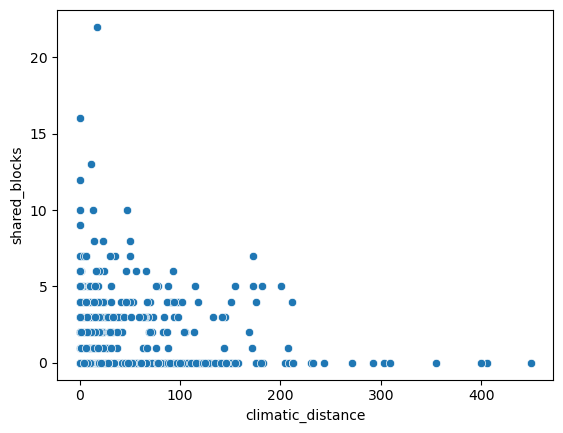

In [107]:
sns.scatterplot(climatic_distances_df, x = 'climatic_distance', y='shared_blocks')

In [108]:
# Add a column for number of shared SNPs to the climatic_distances_df
climatic_distances_df['shared_blocks_names'] = climatic_distances_df['site_pair'].apply(
    lambda pair: filtered_intersections.get(pair, [])
)

In [110]:
climatic_distances_df[climatic_distances_df['shared_blocks']!=0].sort_values('shared_blocks')

,site_pair,climatic_distance,shared_blocks,shared_blocks_names
1,"(1, 11)",9.348247,1,{1_604}
359,"(23, 33)",24.086754,1,{1_5141}
62,"(10, 4)",9.226097,1,{1_421}
801,"(46, 54)",1.352899,1,{2_1974}
376,"(23, 54)",26.515206,1,{4_2811}
...,...,...,...,...
461,"(26, 43)",12.977322,10,"{4_2827, 2_871, 1_663, 3_572, 1_4920, 4_127, 4..."
900,"(52, 9)",0.226942,12,"{2_612, 1_5093, 1_240, 4_1986, 1_264, 2_613, 5..."
921,"(55, 6)",11.727732,13,"{5_939, 1_2349, 1_1928, 2_529, 1_5044, 3_33, 5..."
601,"(32, 43)",0.034515,16,"{1_2349, 1_4920, 4_2454, 5_627, 3_1263, 5_777,..."


In [77]:
climatic_distances_df[climatic_distances_df['shared_blocks']!=0]['site_pair'].values

array([(2, 24), (32, 53), (32, 9), (46, 9), (52, 53), (52, 9), (53, 9)],
      dtype=object)

In [78]:
climate[climate['site'].isin([32, 53, 9,52])]

,site,bio1
17,32,17.815169
33,52,12.005284
34,53,12.362217
43,9,12.481669


In [116]:
block_site_pairs = {}

for idx, row in climatic_distances_df.iterrows():
    site_pair = row['site_pair']
    blocks = row['shared_blocks_names']
    for block in blocks:
        if block in block_site_pairs:
            block_site_pairs[block].append(site_pair)
        else:
            block_site_pairs[block] = [site_pair]

# Convert the block_site_pairs dictionary to a DataFrame and merge with the block count DataFrame
block_site_pairs_df = pd.DataFrame(list(block_site_pairs.items()), columns=['block', 'site_pairs'])
#block_count_df =  pd.DataFrame(list(block_site_pairs.items()), columns=['block', 'site_pairs'])
#block_count_df = block_count_df.merge(block_site_pairs_df, on='block')


In [121]:
count_col = [len(i) for i in block_site_pairs_df['site_pairs']]

In [122]:
block_site_pairs_df['count'] = count_col

In [124]:
block_site_pairs_df.sort_values('count')

,block,site_pairs,count
196,5_540,"[(25, 33)]",1
252,5_2447,"[(27, 57)]",1
251,2_1915,"[(27, 4)]",1
250,2_1929,"[(27, 4)]",1
249,2_1287,"[(27, 4)]",1
...,...,...,...
27,1_590,"[(1, 32), (1, 4), (1, 42), (1, 43), (1, 45), (...",10
25,1_39,"[(1, 27), (1, 32), (1, 42), (1, 43), (28, 32),...",10
303,4_428,"[(37, 53), (37, 9), (46, 52), (46, 53), (46, 5...",10
54,3_1263,"[(10, 2), (10, 25), (10, 32), (10, 43), (10, 4...",11


In [70]:
import pickle
with open('../../key_files/blocks_snpsid_dict.pkl', 'rb') as f:
    dict_blocks = pickle.load(f)

reverse_mapping = {item: key for key, values in dict_blocks.items() for item in values}

In [ ]:
1_2407

In [ ]:
4_2584

In [125]:
dict_blocks['1_2133'][0] #1:13748102-13994169

'1_13748102'

In [126]:
dict_blocks['1_2133'][-1]

'1_13994169'

In [84]:
dict_blocks['1_2407'][0] #1:17383435-17451346

'1_17383435'

In [83]:
dict_blocks['1_2407'][-1]

'1_17451346'

In [80]:
dict_blocks['1_590'][0] 1:5005983-5143789

'1_5005983'

In [79]:
dict_blocks['1_590'][-1]

'1_5143789'

In [74]:
dict_blocks['4_1986'][0] 4:10148608-10149117

'4_10148608'

In [72]:
dict_blocks['4_1986'][-1]

'4_10149117'

In [41]:
wza = pd.read_csv(f'site_4/wza_fitness_gwas_poly7.csv')


In [43]:
wza.sort_values('Z_pVal')

,gene,SNPs,hits,Z,top_candidate_p,Z_pVal
4178,1_4784,16,8,8.616374,1.198311e-12,0.000005
12745,4_2900,13,7,7.924750,1.627888e-11,0.000006
5693,2_1502,3,3,5.745427,1.000000e-06,0.000007
9868,3_335,35,25,11.672575,1.666731e-42,0.000013
4667,1_572,28,0,10.077586,1.000000e+00,0.000026
...,...,...,...,...,...,...
11133,4_1435,9,0,-5.940497,1.000000e+00,0.999921
14001,5_1292,5,0,-5.320052,1.000000e+00,0.999937
11523,4_1789,15,0,-7.118353,1.000000e+00,0.999946
10136,3_530,11,0,-6.638172,1.000000e+00,0.999967


1436       1_23
2904     1_3629
3964      1_459
5629     2_1445
12526    4_2701
Name: gene, dtype: object

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


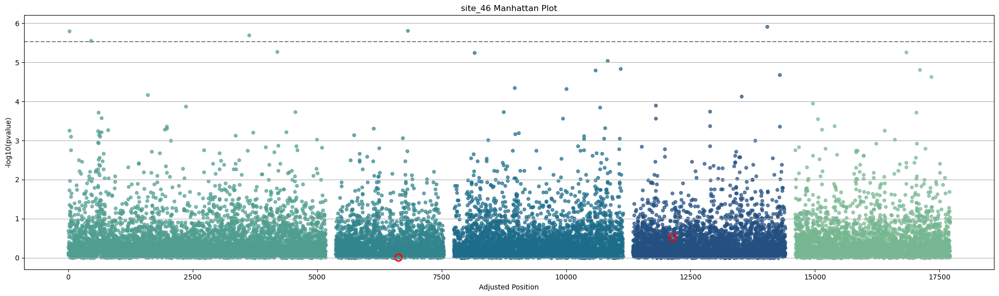

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


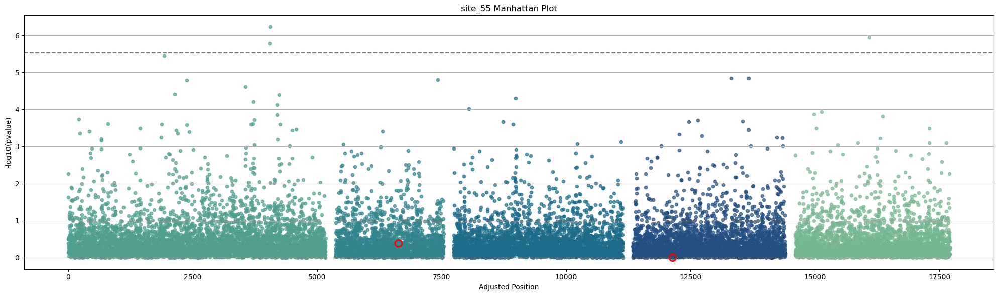

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


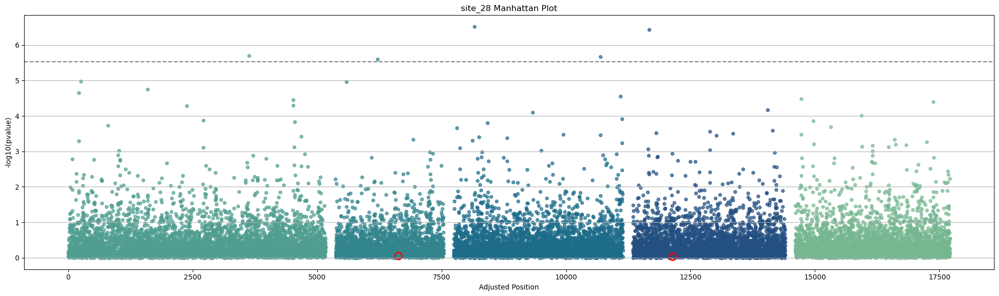

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


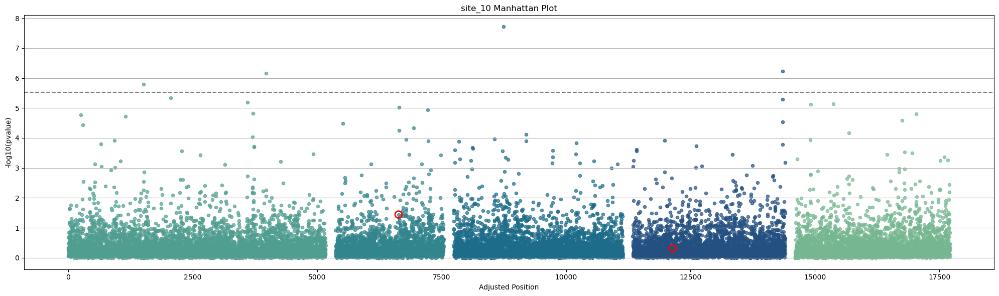

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


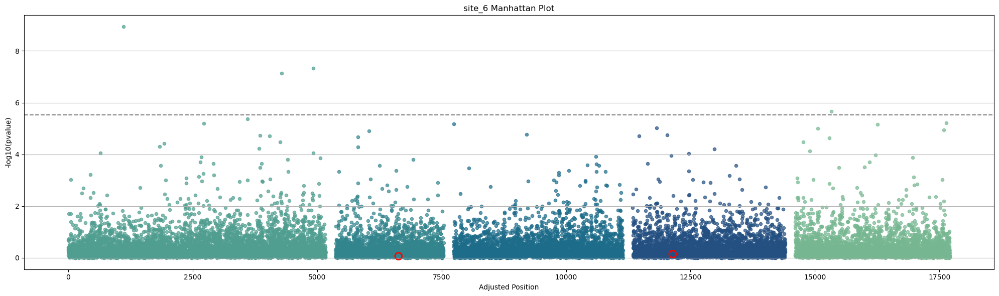

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


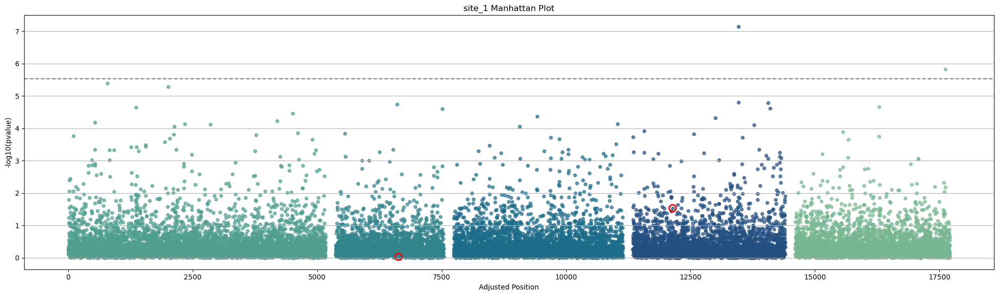

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


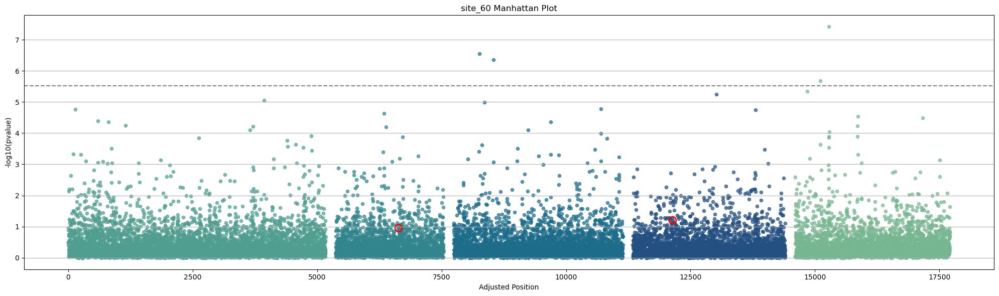

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


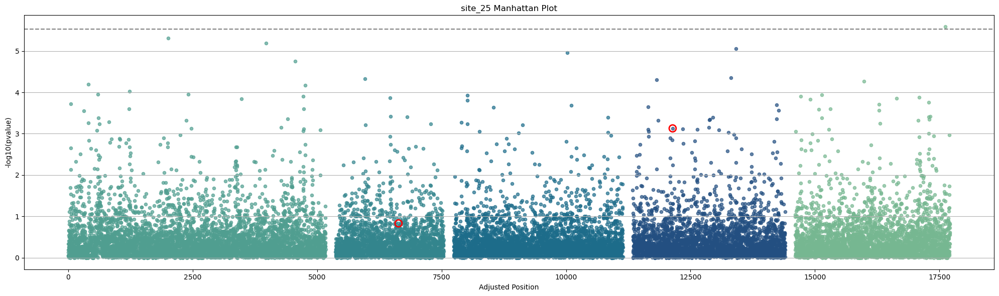

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


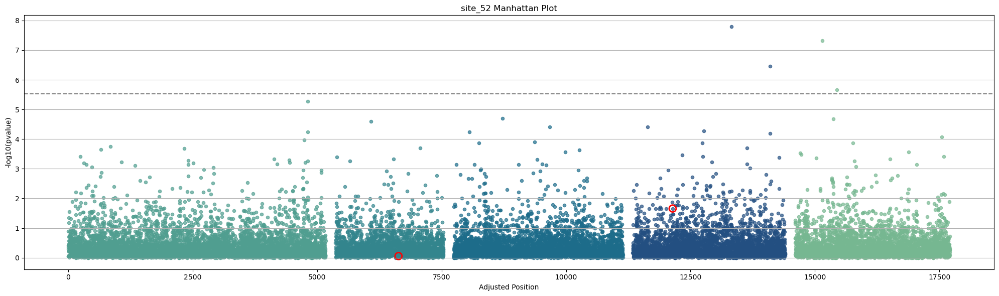

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


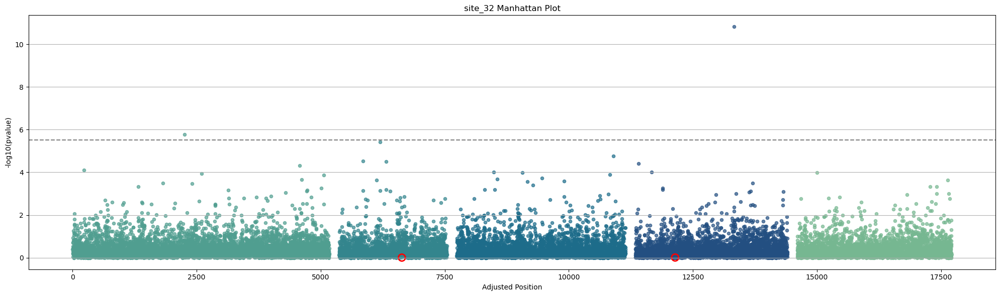

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


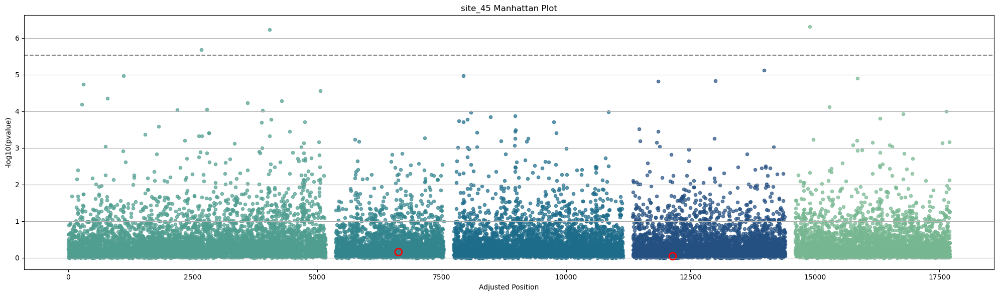

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


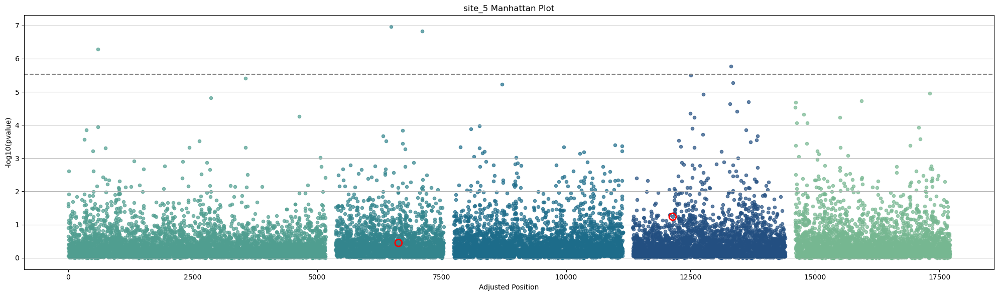

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


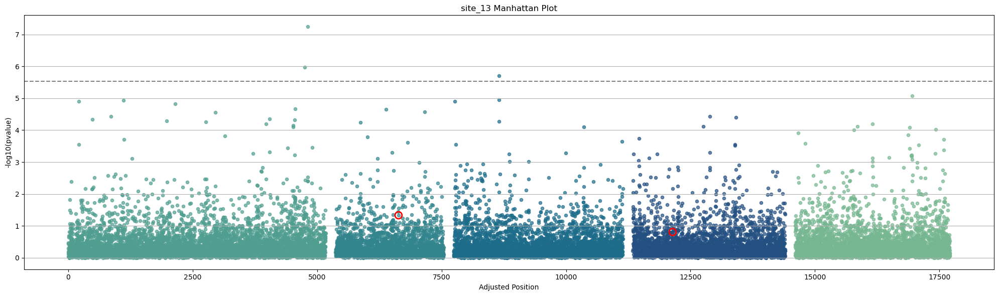

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


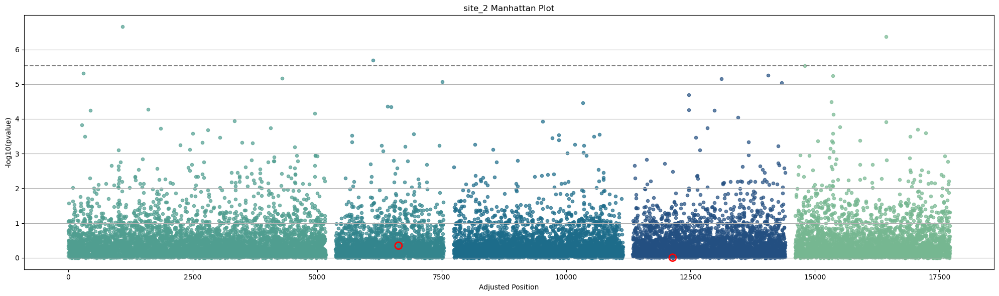

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


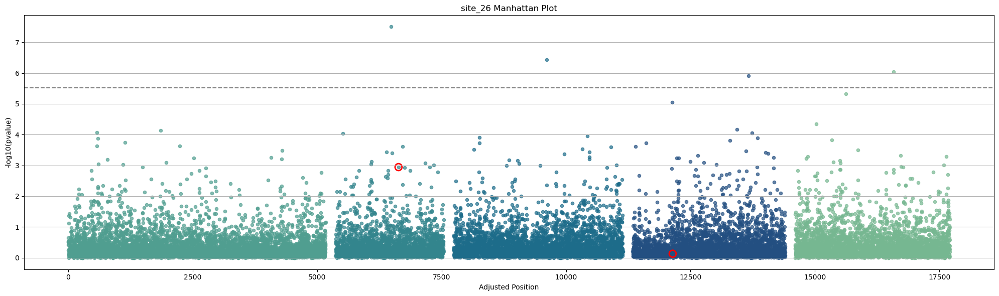

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


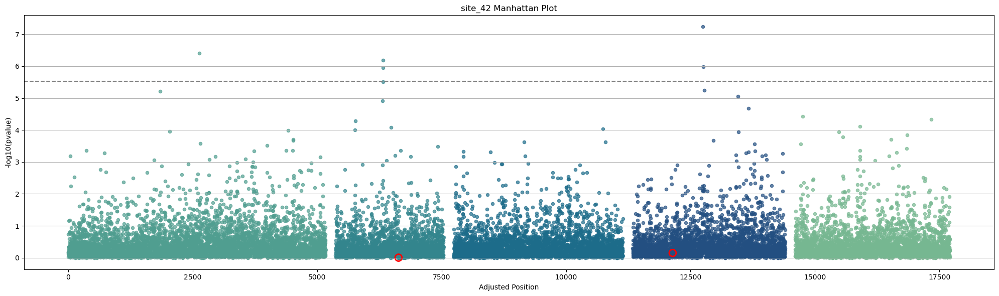

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


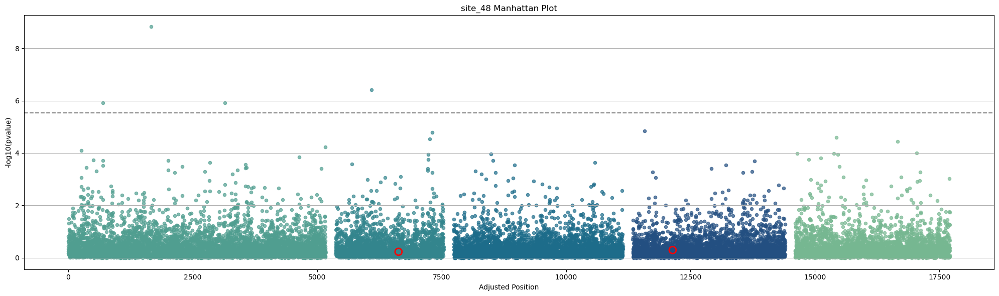

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


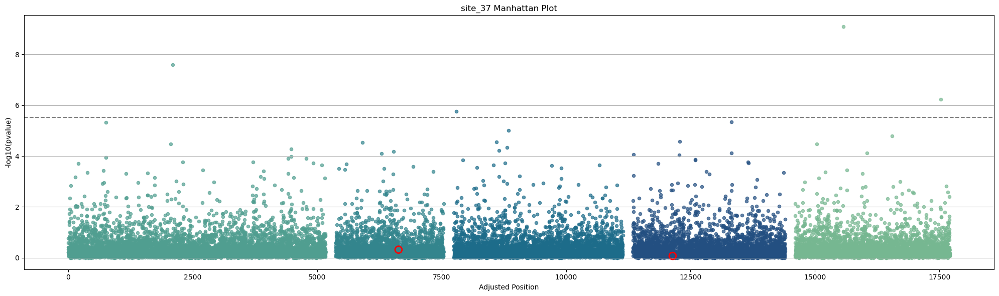

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


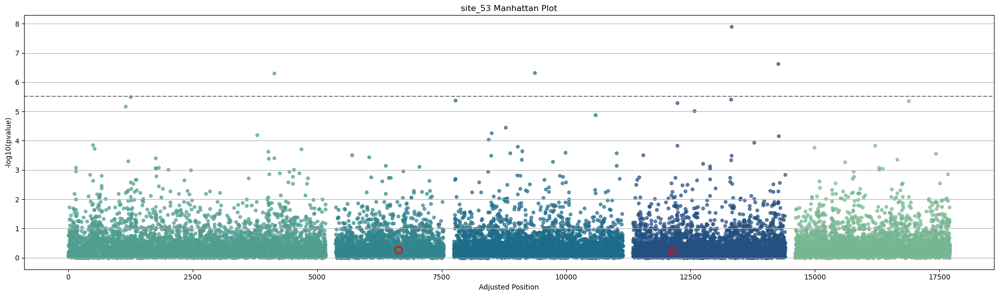

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


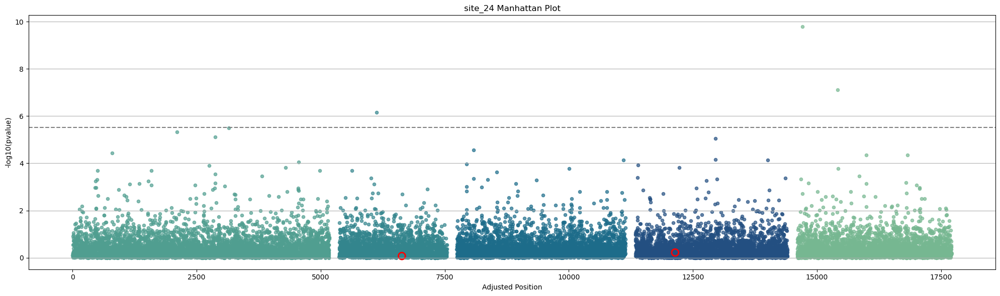

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


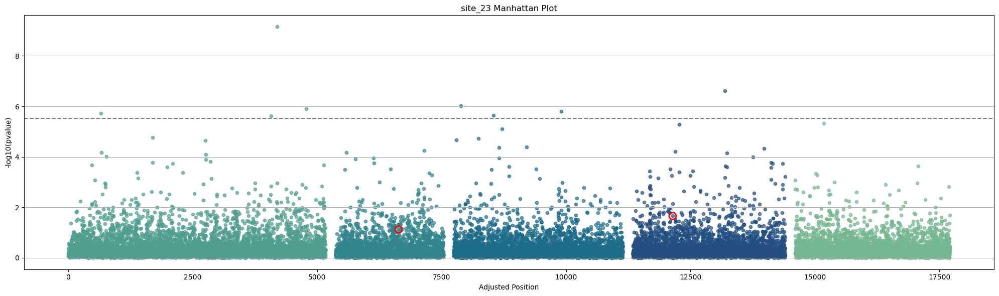

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


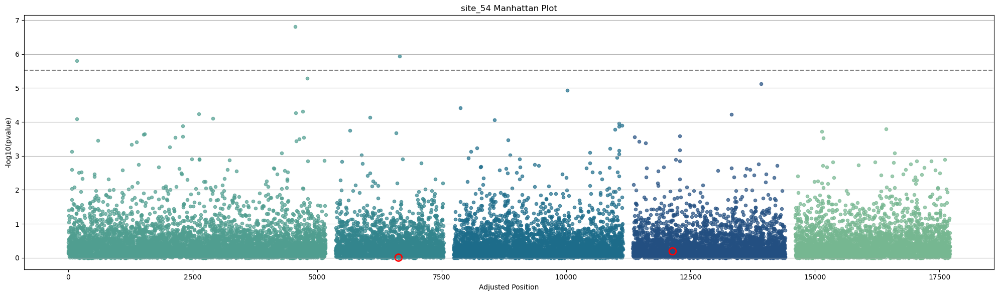

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


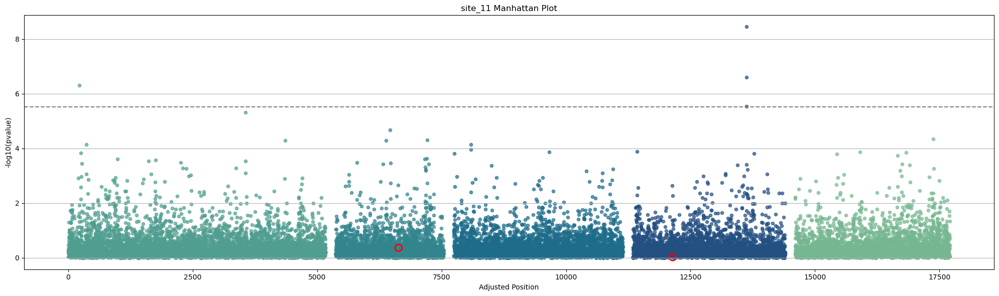

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


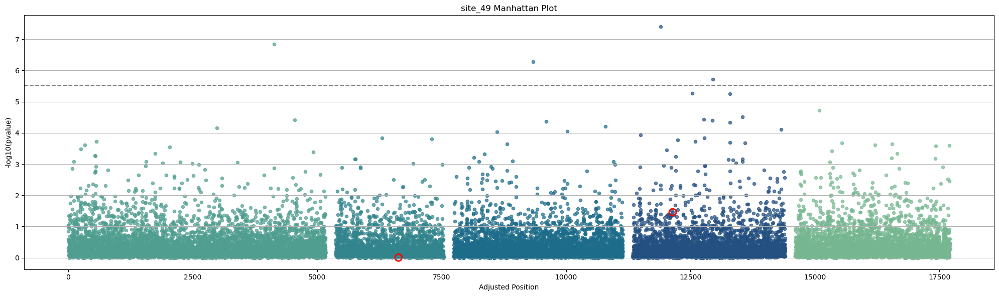

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


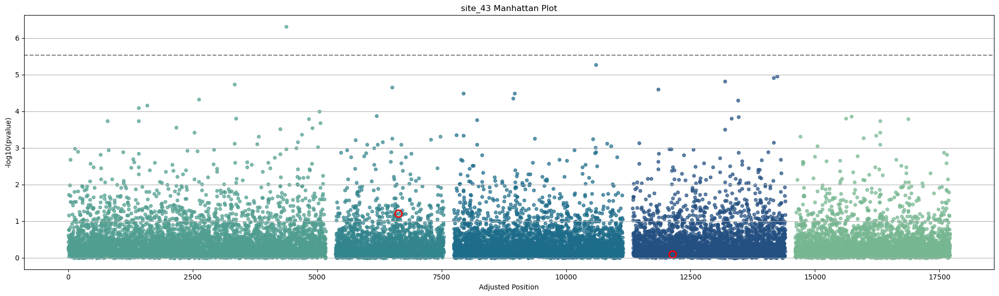

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


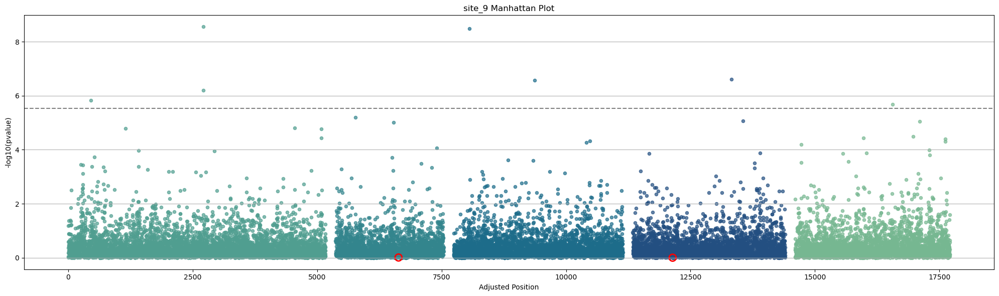

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


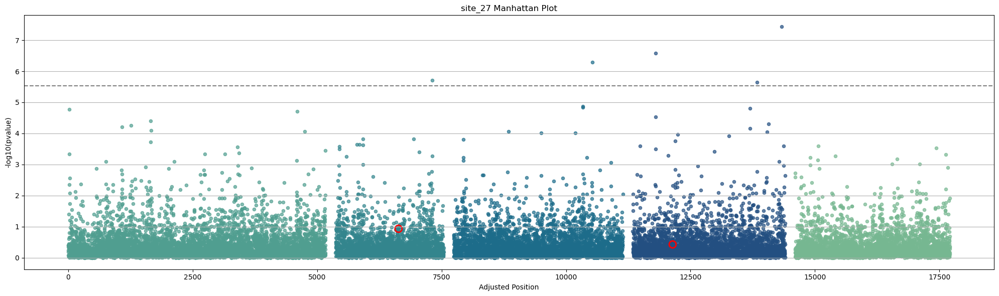

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


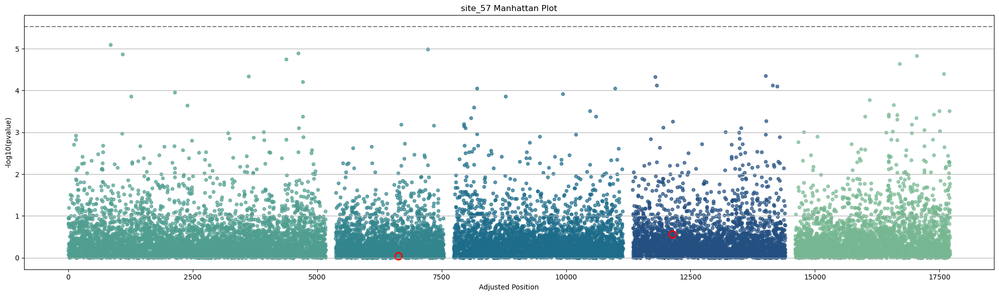

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


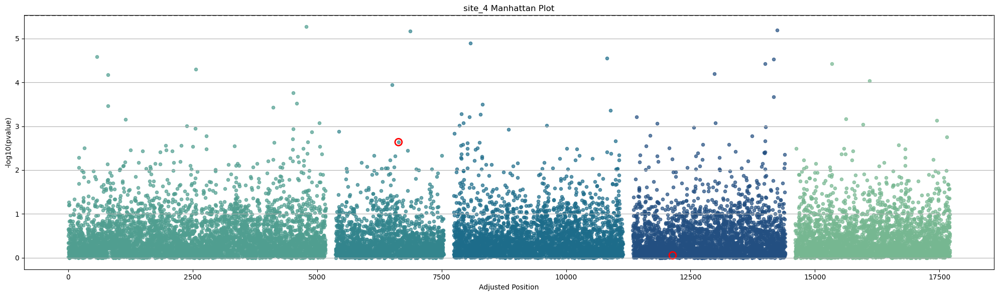

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


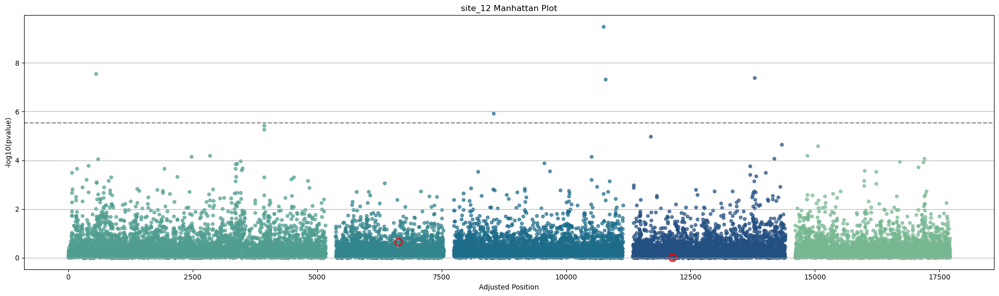

/tmp/ipykernel_79000/2782367763.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


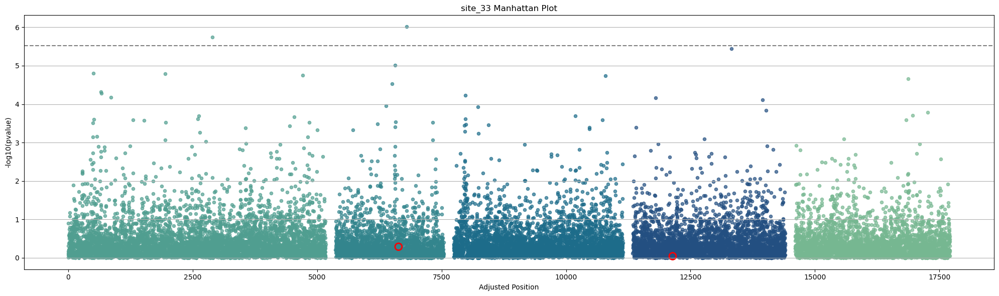

In [134]:
for site in sites:
    wza = pd.read_csv(f'{site}/wza_fitness_gwas_poly7.csv')

    wza['chrom'] = wza['gene'].str.split('_').str[0].astype(int)
    wza['pos'] = wza['gene'].str.split('_').str[1].astype(int)
    threshold_value = 0.05 / len(wza)
    biovar='bio1'
    #sm.qqplot(pvalues['pvalue'], line ='45') 
    #py.show() 
    
    df = wza[['Z_pVal','pos','chrom']].copy()
    
    
    # Parsing chromosome number and position
    df['chromosome'] = df['chrom']
    df['position'] = df['pos']
    df['-log10(pvalue)'] = -np.log10(df['Z_pVal'])
    
    colors = sns.color_palette("crest", n_colors = 5)
    
    # Calculate the offset for each chromosome to prevent overlap
    chromosome_offsets = {}
    offset = 0
    for chrom in sorted(df['chromosome'].unique()):
        chromosome_offsets[chrom] = offset
        max_position = df[df['chromosome'] == chrom]['position'].max()
        offset += max_position + 200  # Buffer to prevent overlap
    
    # Apply offsets to positions
    df['adjusted_position'] = df.apply(lambda row: row['position'] + chromosome_offsets[row['chromosome']], axis=1)
    
    # Normalize sizes for better visualization
    size_transform = 2  # Adjust this factor as needed
    
    
    # Create a color map based on `n_est`
    #df['color'] = df['n_est'].map(lambda x: cmap(norm(x)))
    
    # Creating the Manhattan plot
    plt.figure(figsize=(20, 6))
    
    for chrom in sorted(df['chromosome'].unique()):
        subset = df[df['chromosome'] == chrom]
        plt.scatter(
            subset['adjusted_position'],
            subset['-log10(pvalue)'],
            alpha=0.7,  # Transparency for better visibility
            c=colors[chrom % len(colors)], 
            label=f'Chr {chrom}',
                s= 20)
    
    # Aesthetics
    plt.xlabel('Adjusted Position')
    plt.ylabel('-log10(pvalue)')
    plt.title(f'{site} Manhattan Plot')  # Set the title
    plt.grid(axis='y')
    
    
    #genes = ['2_199', '3_2730', '5_2244']
    genes = ['2_1265', '4_801']
    # Add circles around the specific genes
    for gene in genes:
        chrom, pos = map(int, gene.split('_'))
        subset_gene = df[(df['chromosome'] == chrom) & (df['position'] == pos)]
        if not subset_gene.empty:
            plt.scatter(
                subset_gene['adjusted_position'],
                subset_gene['-log10(pvalue)'],
                edgecolor='red',  # Color of the edge of the circle
                linewidth=2,      # Width of the edge line
                facecolor='none', # Facecolor of the circle (None means transparent)
                s=100,            # Size of the circle
                label=f'Gene {gene}'
            )
    # Create a legend for the number of estimated lineages
    #handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=cmap(norm(n)), markersize=10, label=f'Lineages {n}') for n in sorted(n_est_unique)]
    #plt.legend(handles=handles, title="Estimated Lineages", bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Threshold line
    threshold = -np.log10(threshold_value)
    plt.axhline(y=threshold, color='grey', linestyle='dashed')
    
    # Show the plot
    plt.tight_layout()
    plt.show()


In [135]:
wza

,gene,SNPs,hits,Z,top_candidate_p,Z_pVal,chrom,pos
0,1_0,230,0,1.353716,1.0,0.486126,1,0
1,1_1,4,0,-0.561292,1.0,0.681613,1,1
2,1_10,22,0,0.707132,1.0,0.415930,1,10
3,1_100,55,0,1.729317,1.0,0.361660,1,100
4,1_1000,10,0,0.122221,1.0,0.502357,1,1000
...,...,...,...,...,...,...,...,...
16752,5_995,48,0,-0.218977,1.0,0.570036,5,995
16753,5_996,3,0,-0.774439,1.0,0.741593,5,996
16754,5_997,29,0,-2.793730,1.0,0.876077,5,997
16755,5_998,9,0,-0.613083,1.0,0.672118,5,998


/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


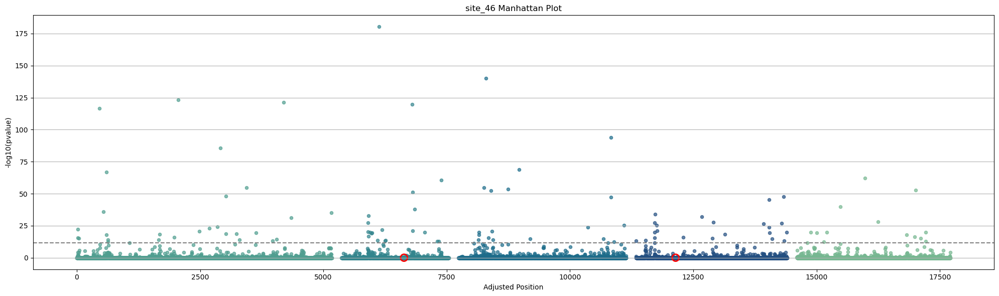

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


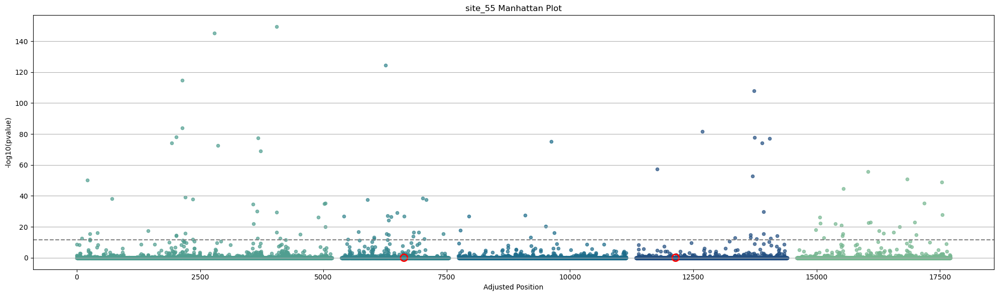

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


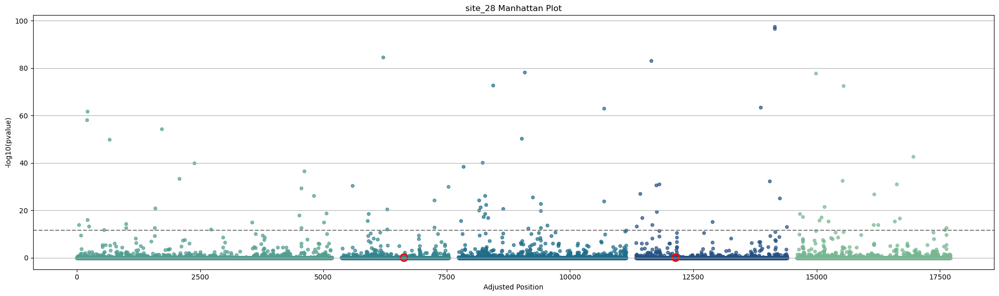

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


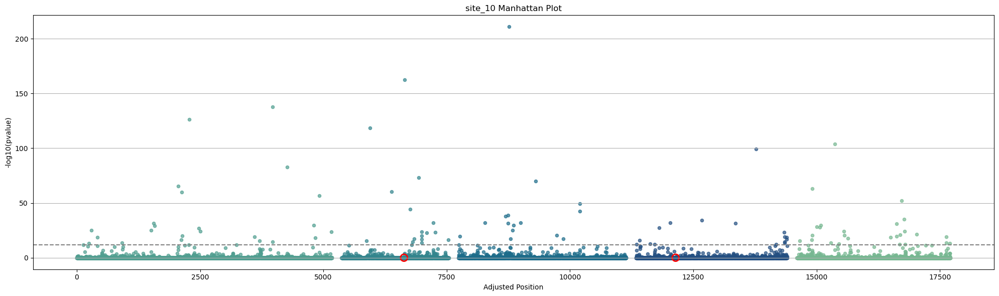

/home/tbellagio/miniforge3/envs/pipeline_snakemake/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


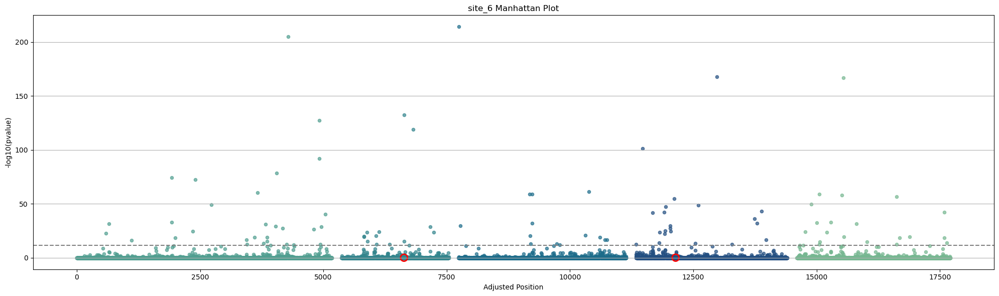

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


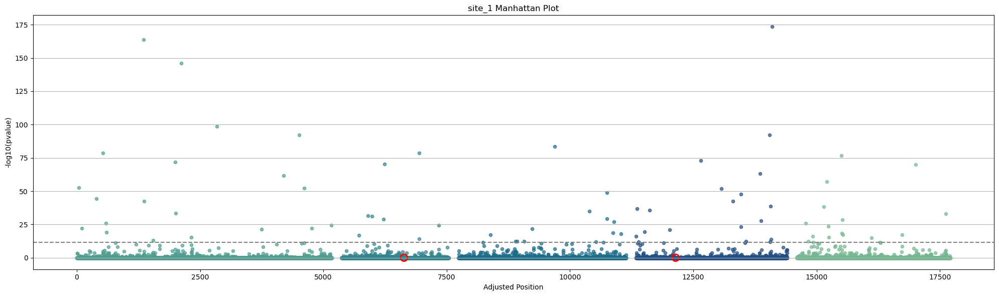

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


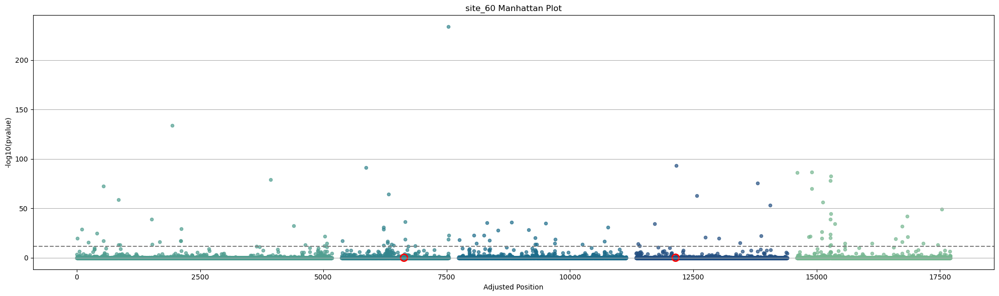

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


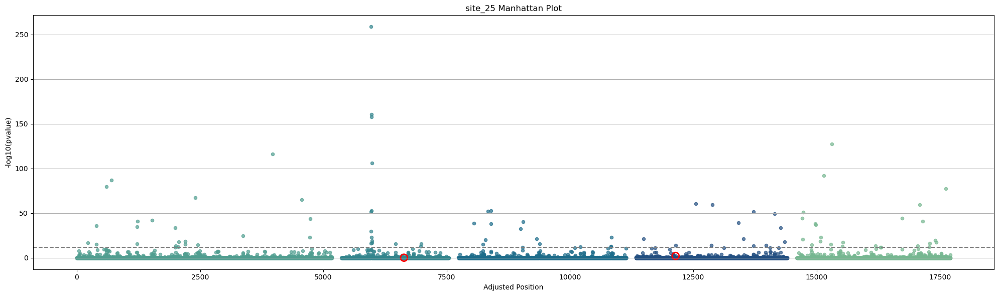

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


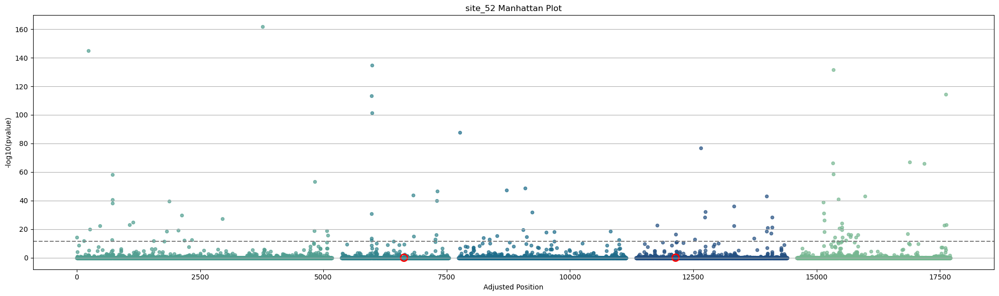

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


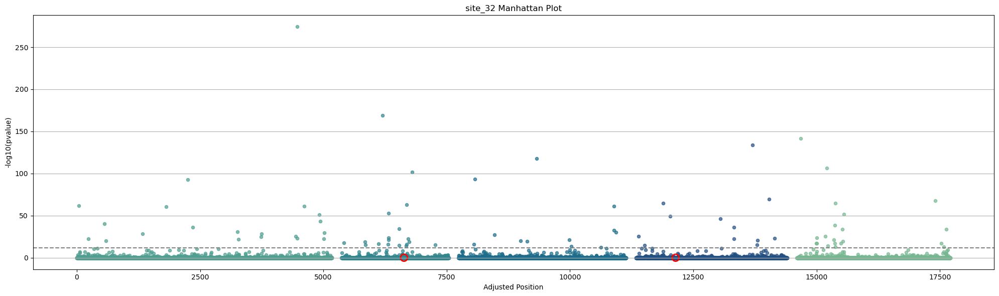

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


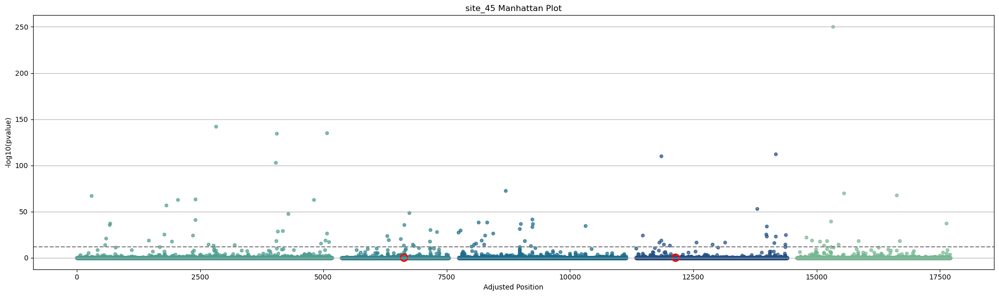

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


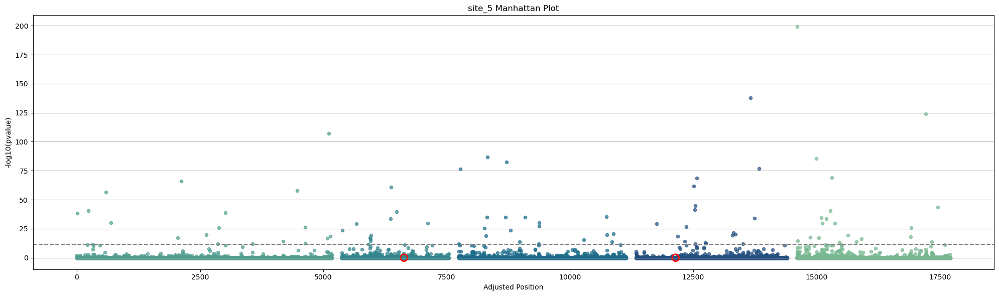

/home/tbellagio/miniforge3/envs/pipeline_snakemake/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


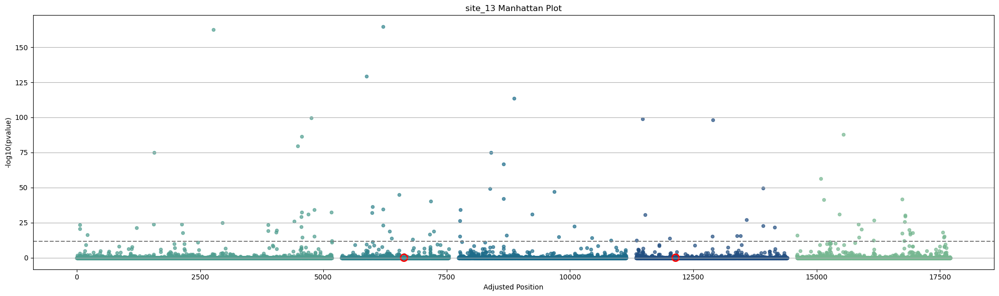

/home/tbellagio/miniforge3/envs/pipeline_snakemake/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


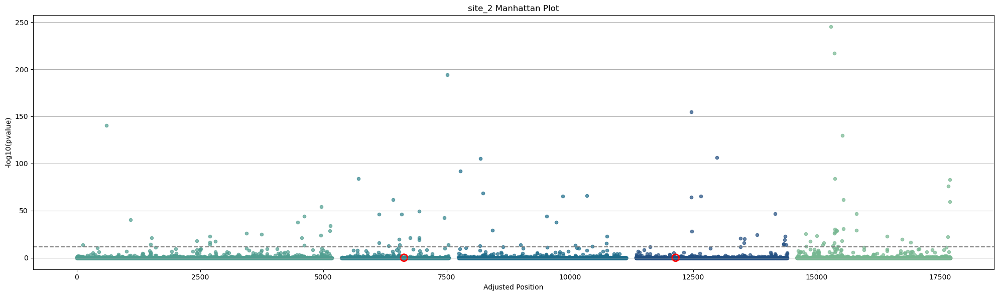

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


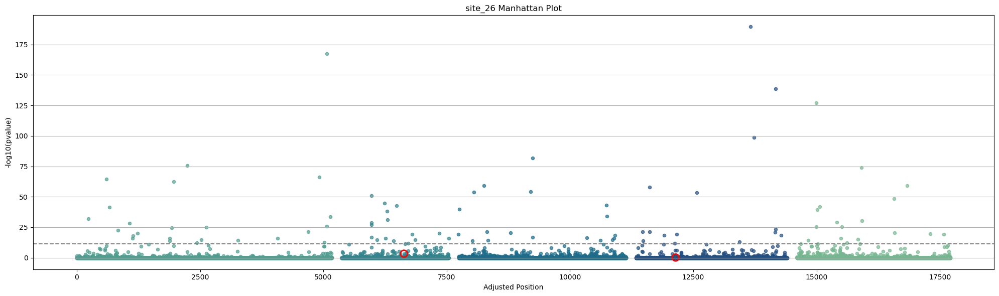

/home/tbellagio/miniforge3/envs/pipeline_snakemake/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


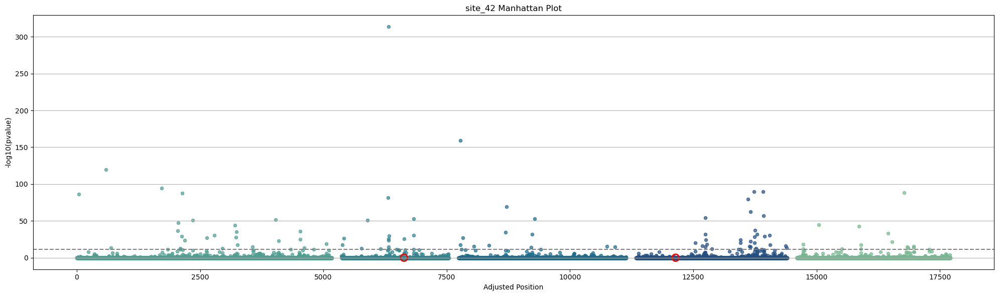

/home/tbellagio/miniforge3/envs/pipeline_snakemake/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


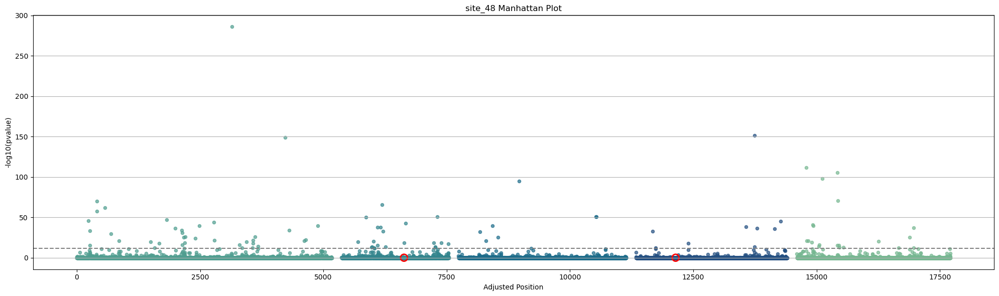

/home/tbellagio/miniforge3/envs/pipeline_snakemake/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


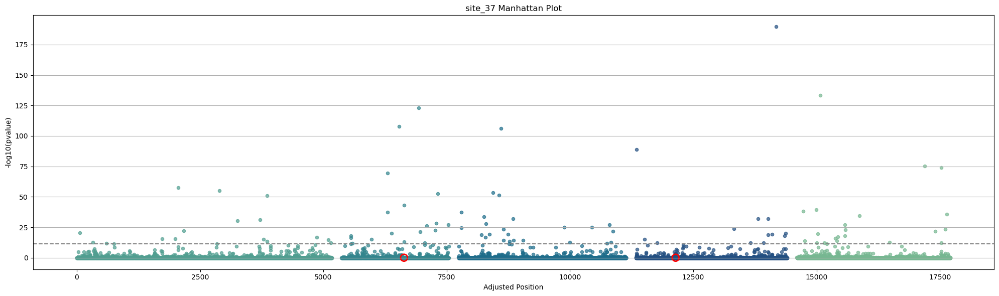

/home/tbellagio/miniforge3/envs/pipeline_snakemake/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


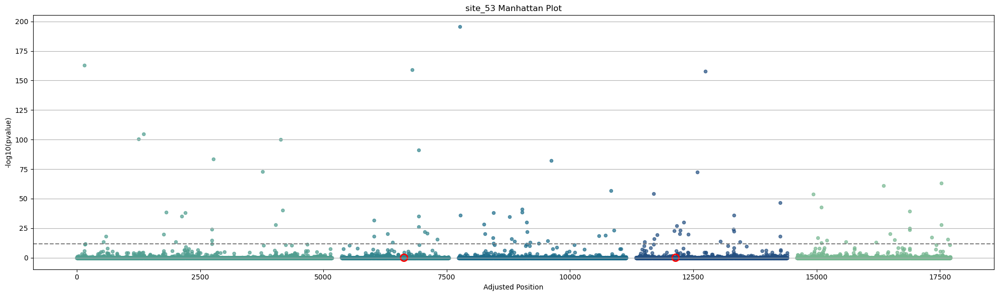

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


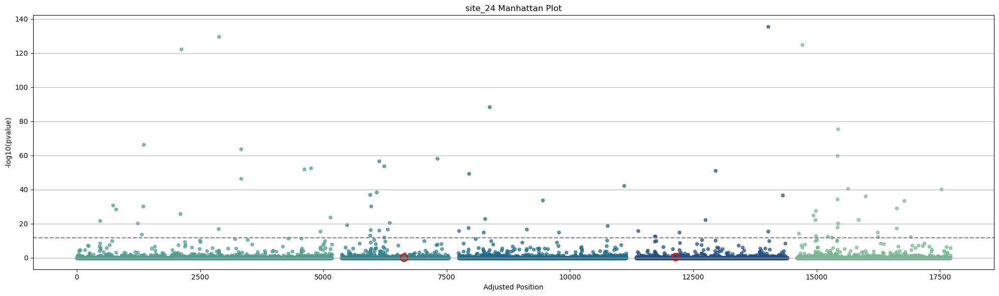

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


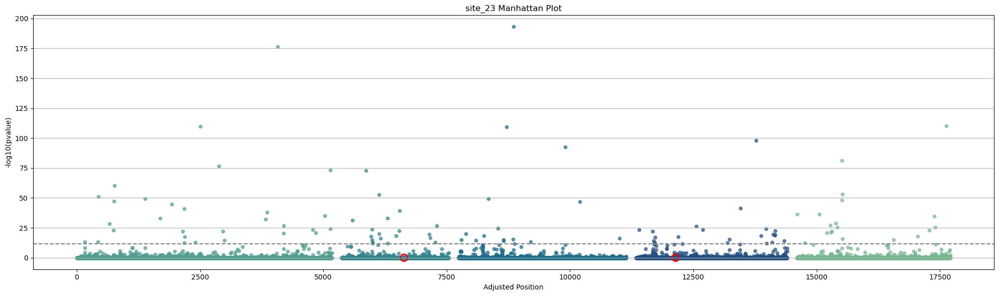

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


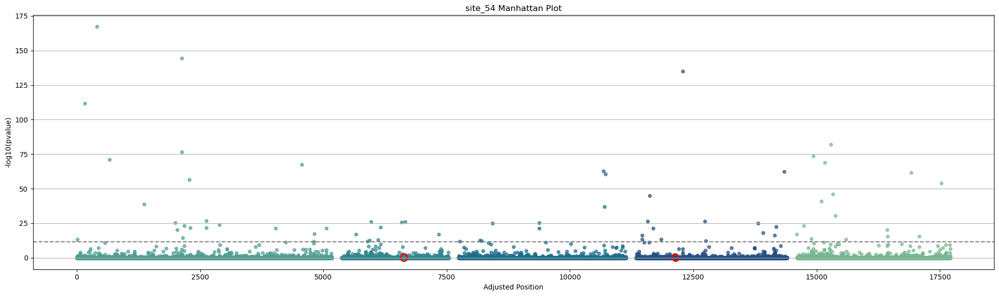

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


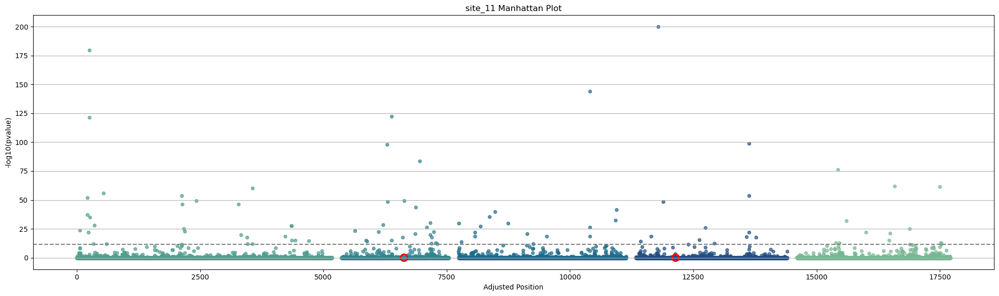

/home/tbellagio/miniforge3/envs/pipeline_snakemake/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


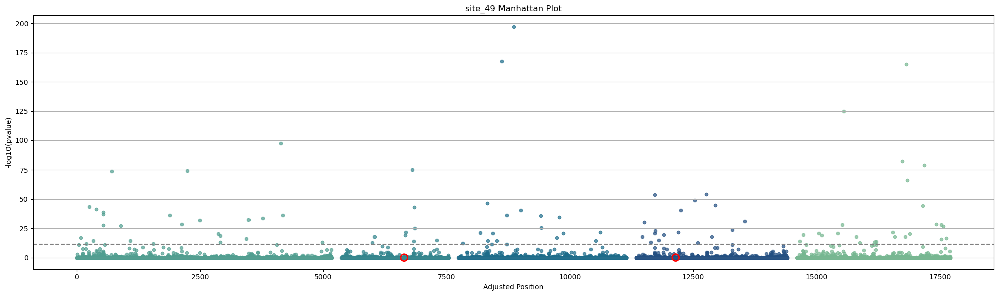

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


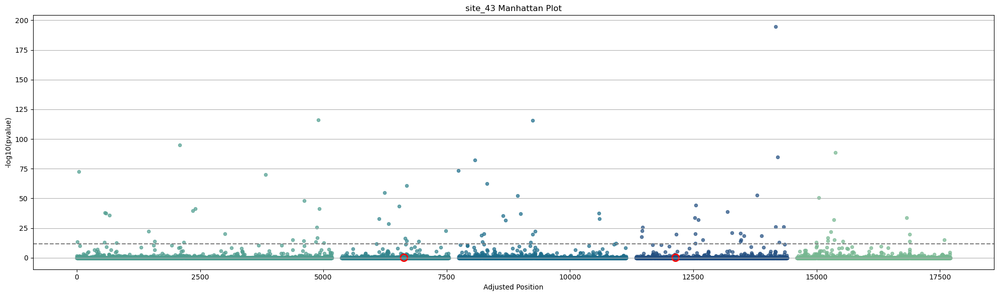

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


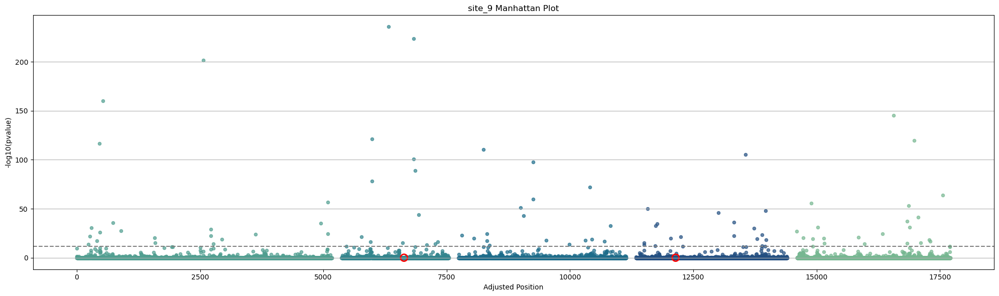

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


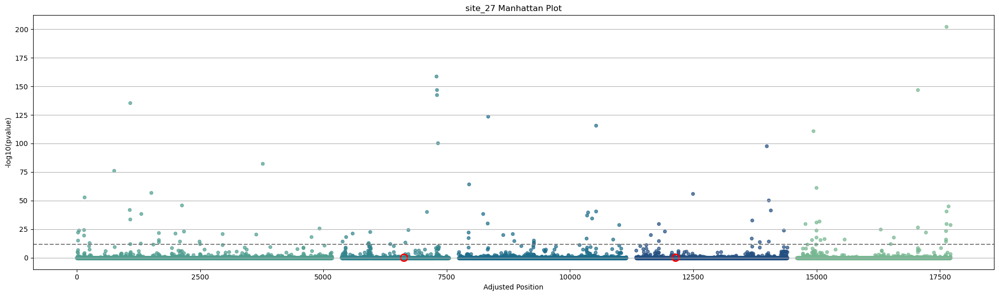

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


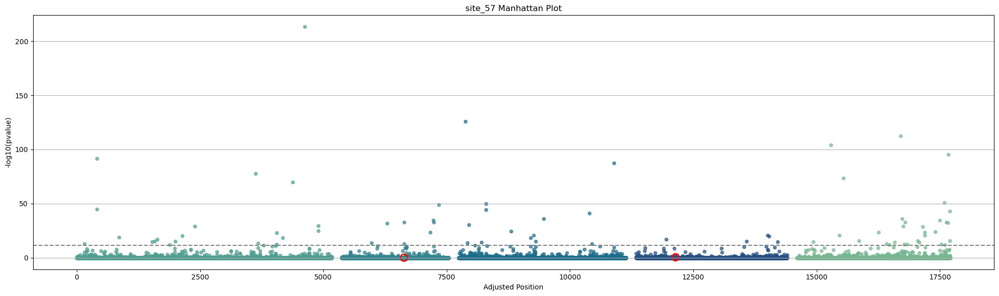

/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


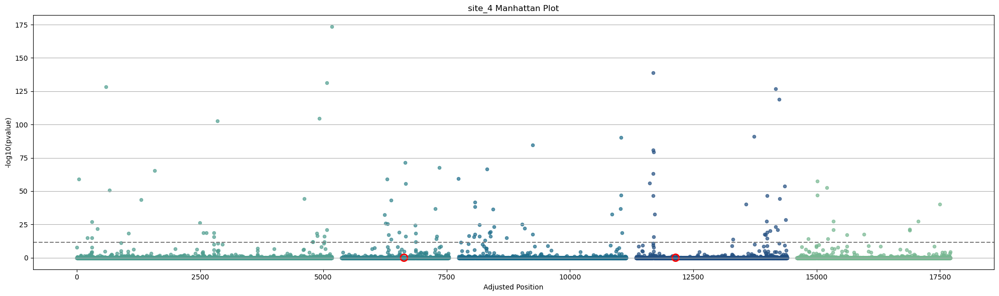

/home/tbellagio/miniforge3/envs/pipeline_snakemake/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


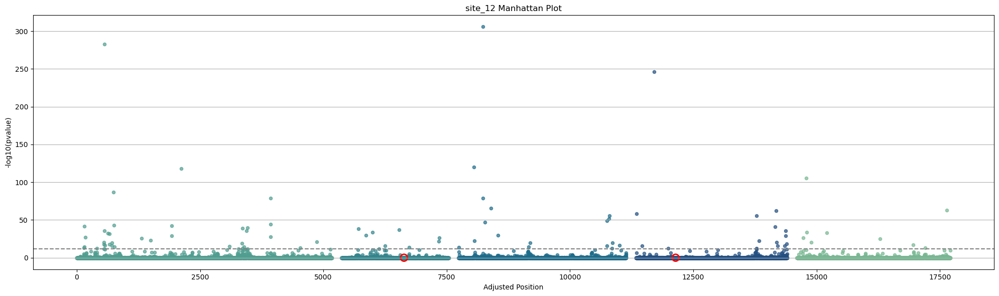

/home/tbellagio/miniforge3/envs/pipeline_snakemake/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_79000/3609670541.py:44: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


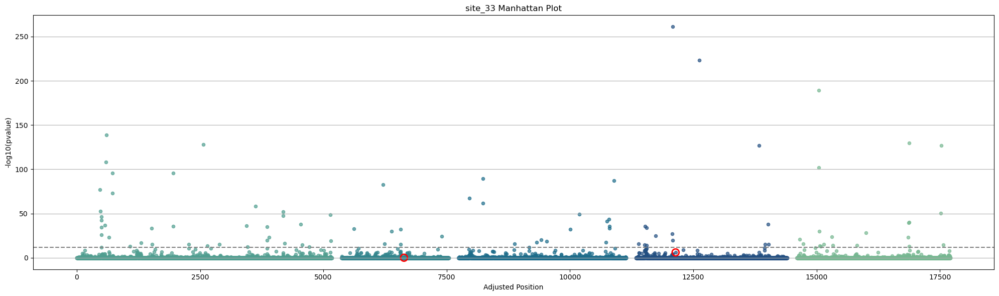

In [137]:
for site in sites:
    wza = pd.read_csv(f'{site}/wza_fitness_gwas_poly7.csv')

    wza['chrom'] = wza['gene'].str.split('_').str[0].astype(int)
    wza['pos'] = wza['gene'].str.split('_').str[1].astype(int)
    threshold_value = 0.05 / (len(wza)* len(pvalues))
    biovar='bio1'
    #sm.qqplot(pvalues['pvalue'], line ='45') 
    #py.show() 
    
    df = wza[['top_candidate_p','pos','chrom']].copy()
    
    
    # Parsing chromosome number and position
    df['chromosome'] = df['chrom']
    df['position'] = df['pos']
    df['-log10(pvalue)'] = -np.log10(df['top_candidate_p'])
    
    colors = sns.color_palette("crest", n_colors = 5)
    
    # Calculate the offset for each chromosome to prevent overlap
    chromosome_offsets = {}
    offset = 0
    for chrom in sorted(df['chromosome'].unique()):
        chromosome_offsets[chrom] = offset
        max_position = df[df['chromosome'] == chrom]['position'].max()
        offset += max_position + 200  # Buffer to prevent overlap
    
    # Apply offsets to positions
    df['adjusted_position'] = df.apply(lambda row: row['position'] + chromosome_offsets[row['chromosome']], axis=1)
    
    # Normalize sizes for better visualization
    size_transform = 2  # Adjust this factor as needed
    
    
    # Create a color map based on `n_est`
    #df['color'] = df['n_est'].map(lambda x: cmap(norm(x)))
    
    # Creating the Manhattan plot
    plt.figure(figsize=(20, 6))
    
    for chrom in sorted(df['chromosome'].unique()):
        subset = df[df['chromosome'] == chrom]
        plt.scatter(
            subset['adjusted_position'],
            subset['-log10(pvalue)'],
            alpha=0.7,  # Transparency for better visibility
            c=colors[chrom % len(colors)], 
            label=f'Chr {chrom}',
                s= 20)
    
    # Aesthetics
    plt.xlabel('Adjusted Position')
    plt.ylabel('-log10(pvalue)')
    plt.title(f'{site} Manhattan Plot')  # Set the title
    plt.grid(axis='y')
    
    
    #genes = ['2_199', '3_2730', '5_2244']
    genes = ['2_1265', '4_801']
    # Add circles around the specific genes
    for gene in genes:
        chrom, pos = map(int, gene.split('_'))
        subset_gene = df[(df['chromosome'] == chrom) & (df['position'] == pos)]
        if not subset_gene.empty:
            plt.scatter(
                subset_gene['adjusted_position'],
                subset_gene['-log10(pvalue)'],
                edgecolor='red',  # Color of the edge of the circle
                linewidth=2,      # Width of the edge line
                facecolor='none', # Facecolor of the circle (None means transparent)
                s=100,            # Size of the circle
                label=f'Gene {gene}'
            )
    # Create a legend for the number of estimated lineages
    #handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=cmap(norm(n)), markersize=10, label=f'Lineages {n}') for n in sorted(n_est_unique)]
    #plt.legend(handles=handles, title="Estimated Lineages", bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Threshold line
    threshold = -np.log10(threshold_value)
    plt.axhline(y=threshold, color='grey', linestyle='dashed')
    
    # Show the plot
    plt.tight_layout()
    plt.show()
